In [ ]:
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.nn.functional as F

import torch.utils.data
from torch.utils.data import DataLoader

from torchvision import datasets, transforms, models

import torchvision.utils as vutils
from torchvision.utils import make_grid
import torch.optim as optim

import torchvision.datasets as dset
import torchvision.transforms as transforms

from PIL import Image
from IPython.display import display
import cv2

from discriminator import Discriminator
from generator import Generator

import argparse
import glob
import os
import random
import numpy as np
import pandas as pd
import pickle as pkl
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.animation as animation
from IPython.display import HTML
import warnings
warnings.filterwarnings('ignore')

In [ ]:
manualSeed = 1234
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True)
torch.cuda.manual_seed(manualSeed)
torch.backends.cudnn.deterministic = True

Random Seed:  1234


In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(torch.cuda.is_available())

False


In [ ]:
def get_dataloader(batch_size, data_dir, transforms):
    """
    Parameters:
        batch_size (int) : Batch size for the DataLoader.
        data_dir (str)   : Directory containing the dataset files.
        transform_img (torchvision.transforms): Image transformation to apply.

    Returns:
        data_loader (torch.utils.data.DataLoader): DataLoader for the specified dataset.
    """
    ds = datasets.ImageFolder(data_dir, transforms)
    data_loader = torch.utils.data.DataLoader(ds, batch_size=batch_size)

    return data_loader

In [ ]:
data_dir = "C:\\Users\\Akhil\\OneDrive\\Desktop\\BTP\\DCGANS\\archive (2)\\img_align_celeba"
# data_dir = "/kaggle/input/celeba-dataset/img_align_celeba"

In [ ]:
batch_size = 32

In [ ]:
unscaled_transform_img = transforms.Compose([
        transforms.Resize(64),
        transforms.CenterCrop(64),
        transforms.ToTensor(),
])

In [ ]:
unscaled_ds = datasets.ImageFolder(data_dir, unscaled_transform_img)
unscaled_train_loader = torch.utils.data.DataLoader(unscaled_ds, batch_size=batch_size)

In [ ]:
print(len(unscaled_train_loader.dataset))


202599


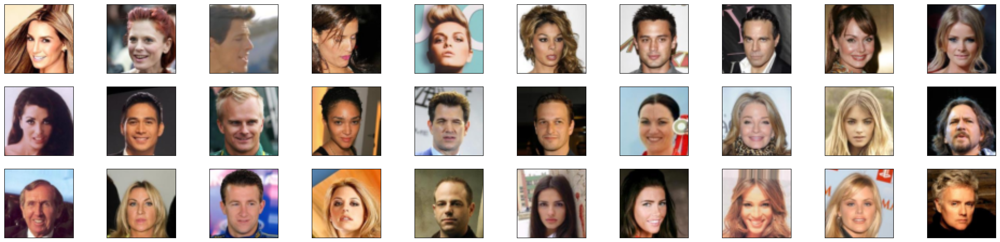

In [ ]:
# obtain one batch of training images which means 32 images
dataiter = iter(unscaled_train_loader)
unscaled_img, _= next(dataiter) # _ for labels, Dataloader sends labels automatically as defined in Dataloader class.
# #However we don't need labels neither we assigned one :p so we put _
# # plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(30, 7))
plot_size=30 # gonna plot 30 images only
for idx in np.arange(plot_size):
    ax = fig.add_subplot(3, plot_size//3, idx+1, xticks=[], yticks=[])
    npimg = unscaled_img[idx].numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

In [ ]:
unscaled_img = unscaled_img[5]
print('Min: ', unscaled_img.min())
print('Max: ', unscaled_img.max())

Min:  tensor(0.0078)
Max:  tensor(1.)


In [ ]:
transform_img = transforms.Compose([
        transforms.Resize(64),
        transforms.CenterCrop(64),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

In [ ]:
ds = datasets.ImageFolder(data_dir, transform_img)
train_loader = torch.utils.data.DataLoader(ds, batch_size=batch_size)

In [ ]:
print(len(train_loader.dataset))

202599


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

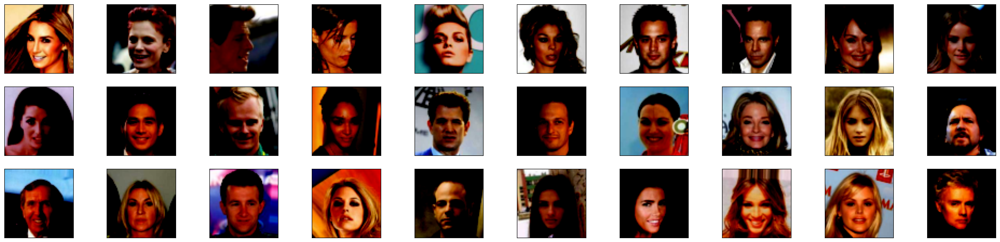

In [ ]:
# obtain one batch of training images which means 32 images
dataiter = iter(train_loader)
img, _= next(dataiter) # _ for labels, Dataloader sends labels automatically as defined in Dataloader class.
# #However we don't need labels neither we assigned one :p so we put _
# # plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(30, 7))
plot_size=30 # gonna plot 30 images only
for idx in np.arange(plot_size):
    ax = fig.add_subplot(3, plot_size//3, idx+1, xticks=[], yticks=[])
    npimg = img[idx].numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))


In [ ]:
img = img[5]
print('Min: ', img.min())
print('Max: ', img.max())


Min:  tensor(-0.9843)
Max:  tensor(1.)


In [ ]:
def weights_init(m):

    classname = m.__class__.__name__

    if classname.find('Conv') != -1:
        nn.init.normal_(tensor = m.weight.data, mean = 0.0, std = 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(tensor = m.weight.data, mean = 1.0, std = 0.02)
        nn.init.constant_(tensor = m.bias.data, val = 0)

In [ ]:
d_conv_dim = 64
discriminator = Discriminator(d_conv_dim)
discriminator.apply(weights_init)
discriminator.to(device)


Discriminator(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv4): Sequential(
    (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv5): Sequential(
    (0): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): Sigmoid()
  )
)

In [ ]:
learning_rate = 0.0002
beta_1=0.5
beta_2=0.999

In [ ]:
optimizer_D = optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(beta_1, beta_2))

In [ ]:
g_conv_dim = 64
z_size = 100
generator = Generator(z_size=z_size, conv_dim=g_conv_dim)
generator.apply(weights_init)
generator.to(device)

Generator(
  (de_conv1): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (de_conv2): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (de_conv3): Sequential(
    (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (de_conv4): Sequential(
    (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (de_conv5): Sequential(
    (0): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  )
  (dropout

In [ ]:
learning_rate = 0.0002
beta_1=0.5
beta_2=0.999

In [ ]:
optimizer_G = optim.Adam(generator.parameters(), lr=learning_rate, betas=(beta_1, beta_2))

In [ ]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, z_size, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

In [ ]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(torch.cuda.is_available())

False


In [ ]:
# Training Loop
num_epochs = 10

print("Starting Training Loop...")

for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, (data,_) in enumerate(train_loader, 0):

        # Format batch
        real_img = data.to(device)
        batch_size = real_img.size(0)

        # TRAIN DISCRIMINATOR
        ###################################

        # Train with REAL batch

        discriminator.zero_grad()

        # Create labels for the real images
        label = torch.full((batch_size,), real_label, dtype=torch.float, device=device)

        # Classify real batch with Discriminator
        output = discriminator(real_img).view(-1)

        # Calculate loss on the real images
        D_error_real = criterion(output, label)

        # backward Propagation
        D_error_real.backward()

        # Calculate mean of Discriminator's output
        D_x = output.mean().item()

        # Train with FAKE batch


        # Generate batch of latent vectors
        noise = torch.randn(batch_size, z_size, 1, 1, device=device)
        # Generate fake image batch with G
        fake = generator(noise)

        # Create labels for fake images
        label.fill_(fake_label)

        # Classify fake batch with Discriminator
        output = discriminator(fake.detach()).view(-1)
        output.to(device)

        # Calculate D's loss on the all-fake batch
        D_error_fake = criterion(output, label)

        # Back Propagation
        D_error_fake.backward()

        # Calculate mean of Discriminator's output
        D_G_z1 = output.mean().item()


        # sum up the error of real batch and fake batch
        D_error = D_error_real + D_error_fake

        # Update D
        optimizer_D.step()

        # TRAIN GENERATOR
        ###################################

        generator.zero_grad()
        # Create labels
        label.fill_(real_label)

        # Classify fake images through Discriminator
        output = discriminator(fake).view(-1)

        # Calculate G's loss
        G_error = criterion(output, label)

        # Backward Propagation
        G_error.backward()

        # Calculate mean of the Discriminator
        D_G_z2 = output.mean().item()

        # Update G
        optimizer_G.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                % (epoch, num_epochs, i, len(train_loader),
                D_error.item(), G_error.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(G_error.item())
        D_losses.append(D_error.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(train_loader)-1)):
            with torch.no_grad():
                fake = generator(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

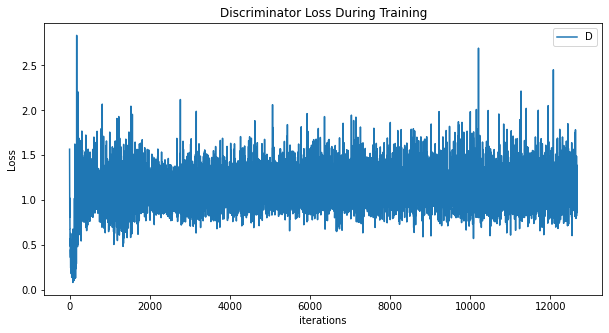

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Discriminator Loss During Training")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

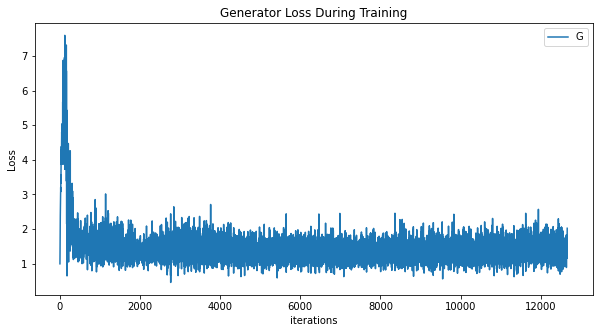

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator Loss During Training")
plt.plot(G_losses,label="G")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

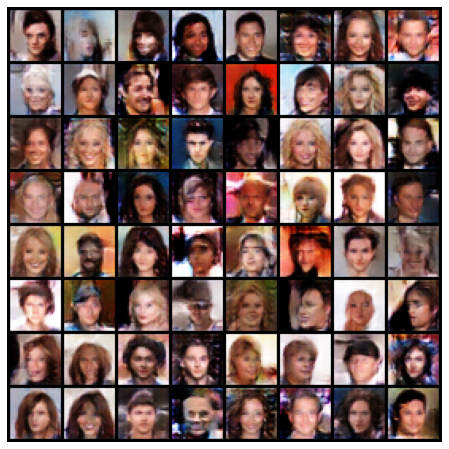

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())